## Final Project, Milestone 3

### Milestone 3 Goal from the Proposal:

Student media data from milestones 1 and 2 visualized on hover on the map from milestone 1. 

I also needed to finish merging the two dataframes. 

## Summary of Milestone 3 Accomplishments:

**Task 1: Merging the Dataframes**
1. The fuzzy-manual merge using the script I wrote took about 2 hours and resulted in 873 media not merged with schools (out of 2,574). So the success rate was 66%, a significant improvement over last week. Doing the full merge I also learned how to improve the script to speed up the process if I use it again (e.g., eliminate "high school" and "high" from both elements being compared). 
2. I manually checked the remaining 873 unmerged schools, which took about 4 hours. In the end, 1,789 media were mached with their schools, so 785 media were not included in the final dataset because they were either at private schools, at middle schools, the schools weren't on the DOE list of schools, or the media were not affiliated schools.

**Task 2: Visualizing the Data on a Map**

I worked with Plotly's Graph Objects scattergeo command (?) to visualize the merged data on a map. Things I accomplished:
1. Distinguished between schools with and without student media using different color markers.
2. Customized the hover text:
   a. It no longer shows the x/y coordinates, which seems to be a preset. 
   b. It shows school names, cities, and states.
   c. For schools with student media, it shows the media names and URLs.
3. Following the "overview first, zoom and filter, details on demand" approach, I created two sets of two visualizations:
   a. Two overview maps, one showing all the schools, and one showing all the schools and all the media.
   b. Taking a step toward "zoom and filter," I created a map of only all rural schools, and one of rural schools with and without media.

**Goals for next week**

1. Add a legend.
2. Resolve URL issues:
  - Right now, it's not very legible because it displays in a random 'link' color. The different link seems unnecessary. I would like to keep it white, like the rest of the text in the hover.
  - It may be possible to build an action wherein one clicks on the hover and is taken to that URL. I believe it requires some Javascript coding. I may investigate how to make this happen.
3. Investigate if there are better geo scopes to use. The one I am using now is very basic.
4. Continue slicing the data (i.e., "zoom and filter") to show disparities in school media distribution.
- Continue slicing by locale (i.e., urban, suburban)
- Slice by underserved / privileged populations (free and reduced price lunch).
- Slice by race / ethnicity of student populations.
- Slice by CTE schools. 
5. Create buttons for each of these slices?
6. Write copy to describe all of the visualizations.

## **Milestone 3 Details:**

### **Task 1: Finish merging the dataframes**

In [59]:
import pandas as pd
from fuzzywuzzy import fuzz

In [62]:
schools = pd.read_csv('Public_School_Characteristics_2021-22.csv')
schools

,X,Y,NCESSCH,SURVYEAR,ST_LEAID,LEA_NAME,School,City,State,CHARTER_TEXT,...,HIALF,HI,TRALM,TRALF,TR,WHALM,WHALF,WH,LATCOD,LONCOD
0,-176.640331,51.868164,2.000100e+10,2021-2022,AK-04,Aleutian Region School District,Adak School,Adak,AK,No,...,3.0,5.0,1.0,0.0,1.0,0.0,1.0,1.0,51.868164,-176.640331
1,-154.173260,56.946831,2.004800e+10,2021-2022,AK-28,Kodiak Island Borough School District,Akhiok School,Akhiok,AK,No,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,56.946831,-154.173260
2,-161.448992,60.913883,2.000040e+10,2021-2022,AK-54,Yupiit School District,Akiachak School,Akiachak,AK,No,...,0.0,0.0,2.0,1.0,3.0,0.0,1.0,1.0,60.913883,-161.448992
3,-161.229711,60.907187,2.000040e+10,2021-2022,AK-54,Yupiit School District,Akiak School,Akiak,AK,No,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,60.907187,-161.229711
4,-165.772270,54.134961,2.000070e+10,2021-2022,AK-56,Aleutians East Borough School District,Akutan School,Akutan,AK,No,...,0.0,0.0,1.0,2.0,3.0,0.0,0.0,0.0,54.134961,-165.772270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22393,-104.618595,44.097024,5.606090e+11,2021-2022,WY-2307000,Weston County School District #7,Upton High School,Upton,WY,No,...,1.0,1.0,2.0,0.0,2.0,40.0,32.0,72.0,44.097024,-104.618595
22394,-104.958098,42.059451,5.605090e+11,2021-2022,WY-1601000,Platte County School District #1,Wheatland High School,Wheatland,WY,No,...,17.0,39.0,1.0,1.0,2.0,115.0,112.0,227.0,42.059451,-104.958098
22395,-107.944684,44.009249,5.606240e+11,2021-2022,WY-2201000,Washakie County School District #1,Worland High School,Worland,WY,No,...,57.0,101.0,6.0,2.0,8.0,152.0,137.0,289.0,44.009249,-107.944684
22396,-105.491657,43.756234,5.601470e+11,2021-2022,WY-0301000,Campbell County School District #1,Wright Jr. & Sr. High School,Wright,WY,No,...,10.0,24.0,1.0,3.0,4.0,86.0,74.0,160.0,43.756234,-105.491657


In [63]:
sno_media = pd.read_csv('SNO school media.csv')
sno_media

,id,Media,URL,School,City,State
0,0,Acropolis Times,https://ahsacropolistimes.com/,Athens High School,Athens,AL
1,1,The Hurricane Herald,https://thehurricaneherald.com/,Brookwood High School,Brookwood,AL
2,2,The Buzz,http://chelseabuzz.com/,Chelsea High School,Chelsea,AL
3,3,The Daphne Oracle,https://daphneoracle.org/,Daphne High School,Daphne,AL
4,4,The Pirateer,https://fhspirateer.com/,Fairhope High School,Fairhope,AL
...,...,...,...,...,...,...
2569,2570,The Lariat,https://cheyennecentralhighlariat.org/,Cheyenne Central High School,Cheyenne,WY
2570,2571,Thunderbolt,http://ehsthunderbolt.com/,Cheyenne East High School,Cheyenne,WY
2571,2572,Spartan Mirror,https://triumphspartanmirror.com/,Triumph High School,Cheyenne,WY
2572,2573,The Prowl,https://phsprowl.com/,Powell High School,Powell,WY


#### **Merging Script Using Fuzzy Wuzzy and Human Input**

### **Task 2: Visualizing the Merged Data**

In [ ]:
# Set up empty columns for values to populate from the sno_media dataframe
alldata = pd.DataFrame(schools)
alldata['id'] = None
alldata['Media'] = None
alldata['URL'] = None
alldata['Present'] = 0

# Iterate through the sno_media dataframe and set up city+state variable
for j in sno_media.index:
    citystate_media = ((sno_media['City'][j]).lower(), sno_media['State'][j])

# Iterate through the schools dataframe and set up city+state variable
    for i in schools.index:
        citystate_schools = ((schools['City'][i]).lower(), schools['State'][i])

# Compare the two city+state variables
        if citystate_schools == citystate_media:

# If school names match exactly, merge that row
            if (schools['School'][i]).lower() == (sno_media['School'][j]).lower():

                alldata.at[i, 'id'] = sno_media['id'][j]
                alldata.at[i, 'Media'] = sno_media['Media'][j]
                alldata.at[i, 'URL'] = sno_media['URL'][j]
                alldata.at[i, 'Present'] = 1

                print(schools['School'][i], "and", sno_media['School'][j], "merged.")
                print()
                break
                
# Else if fuzzy comparison reaches some threshold, ask for human input and maybe merge that row
# But first eliminate 'high school' from the compared names because it inflates the likeness score
            # Post-merge note: Also should eliminate 'high', 'hs', 'h s', 'senior', 'area', and place this at the top
            
            else:
                fuzz_school = (schools['School'][i]).lower()
                fuzz_media = (sno_media['School'][j]).lower()

                if 'high school' in fuzz_school:
                    fuzz_school = fuzz_school.replace('high school', '')

                if 'high' in fuzz_school:
                    fuzz_school = fuzz_school.replace('high', '')

                if 'high school' in fuzz_media:
                    fuzz_media = fuzz_media.replace('high school', '')

                fuzz_score = fuzz.partial_ratio(fuzz_school, fuzz_media)
                
                if fuzz_score >= 85:
                    print("Match score: ", fuzz_score, ". Is ", schools['School'][i], " in ", schools['City'][i], schools['State'][i], " the same as ", sno_media['School'][j], " in ", sno_media['City'][j], sno_media['State'][j], "?")
                    judgment = input()
                    
                    if judgment == "y":
                        alldata.at[i, 'id'] = sno_media['id'][j]
                        alldata.at[i, 'Media'] = sno_media['Media'][j]
                        alldata.at[i, 'URL'] = sno_media['URL'][j]
                        alldata.at[i, 'Present'] = 1
                        
                        print(schools['School'][i], " and ", sno_media['School'][j], " merged.")
                        print()
                        break
                        
                    else:
                        print("Schools not merged.")
                        print()
                
# Make a list of ids in the merged dataset, and a list of ids missing from the merged dataset
all_ids = sno_media['id']
ids_merged = [k for k in alldata['id'] if k is not None]
ids_notmerged = [l for l in all_ids if l not in ids_merged]

# For every id in ids_notmerged, append row to the bottom of the merged dataset
for m in ids_notmerged:
    row = {'id': sno_media['id'][m], 'Media': sno_media['Media'][m], 'URL': sno_media['URL'][m], 'School': sno_media['School'][m], 'City': sno_media['City'][m], 'State': sno_media['State'][m], 'Present': 0}
    row_df = pd.DataFrame([row])
    alldata = pd.concat([alldata, row_df], axis=0, ignore_index=True)

# Save merged file to CSV
alldata.to_csv('thirdmerge.csv')

# End-of-merge message
print("*** Merge complete. CSV file created. ***")

Athens High School and Athens High School merged.

Brookwood High School and Brookwood High School merged.

Chelsea High School and Chelsea High School merged.

Daphne High School and Daphne High School merged.

Fairhope High School and Fairhope High School merged.

Sparkman High School and Sparkman High School merged.

Homewood High School and Homewood High School merged.

Match score:  87 . Is  Virgil Grissom High School  in  Huntsville AL  the same as  Virgil I Grissom High School  in  Huntsville AL ?


#### **A Map of Public High Schools**

In [6]:
import plotly.graph_objects as go

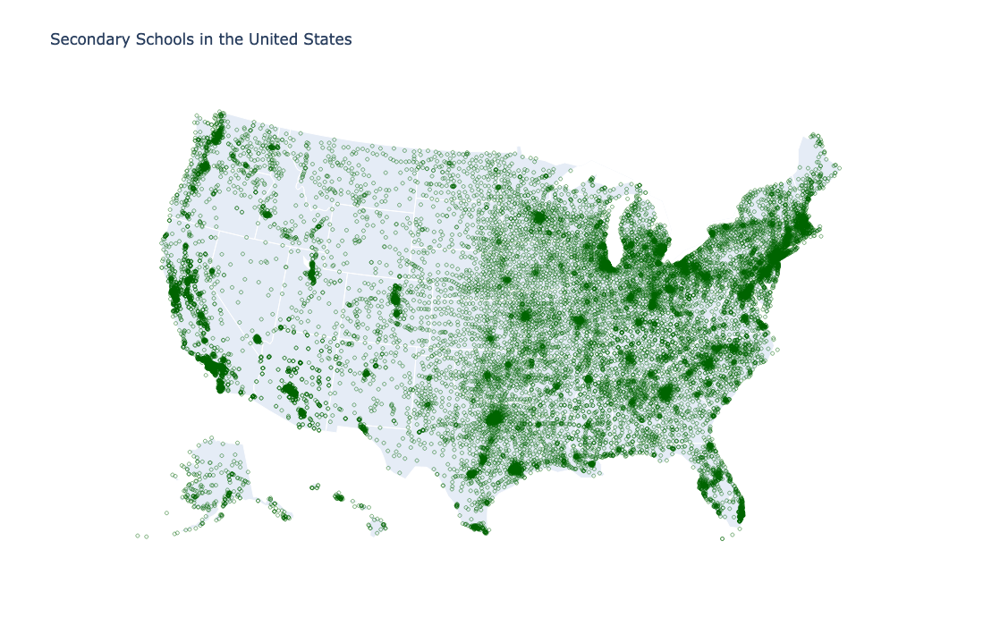

In [92]:
alldata = pd.read_csv('thirdmerge_alldata.csv')

fig1 = go.Figure()

# Setting up to display states on hover using AP Style state abbreviations
ap_state_abbreviations = {"AL": "Ala.", "AK": "Alaska", "AZ": "Ariz.", "AR": "Ark.", "CA": "Calif.", "CO": "Colo.", "CT": "Conn.", "DE": "Del.", "FL": "Fla.",\
    "GA": "Ga.", "HI": "Hawaii", "ID": "Idaho", "IL": "Ill.", "IN": "Ind.", "IA": "Iowa", "KS": "Kan.", "KY": "Ky.", "LA": "La.", "ME": "Maine",\
    "MD": "Md.", "MA": "Mass.", "MI": "Mich.", "MN": "Minn.", "MS": "Miss.", "MO": "Mo.", "MT": "Mont.", "NE": "Neb.", "NV": "Nev.", "NH": "N.H.",\
    "NJ": "N.J.", "NM": "N.M.", "NY": "N.Y.", "NC": "N.C.", "ND": "N.D.", "OH": "Ohio", "OK": "Okla.", "OR": "Ore.", "PA": "Pa.", "RI": "R.I.",\
    "SC": "S.C.", "SD": "S.D.", "TN": "Tenn.", "TX": "Texas", "UT": "Utah", "VT": "Vt.", "VA": "Va.", "WA": "Wash.", "WV": "W.Va.", "WI": "Wis.",\
    "WY": "Wyo."}
alldata['State_AP'] = alldata['State'].map(ap_state_abbreviations)

# Setting up hover information
def custom_hover_text(row):
    if row['Present'] == 2:
        return f"<br>{str.title(row['School'])}</br>{str.title(row['City'])}, {row['State_AP']}</br>{row['Media']}<br><a href='{row['URL']}'>{row['URL']}</a>"
    else:
        return f"<br>{str.title(row['School'])}</br>{str.title(row['City'])}, {row['State_AP']}"

# Updating the figure
fig1.add_trace(go.Scattergeo(
    lon = alldata['X'],
    lat = alldata['Y'],
    mode = 'markers',
    hoverinfo = 'text',
    hovertext=alldata.apply(custom_hover_text, axis=1),
    marker = dict(color = 'darkgreen',\
                  line_color = 'darkgreen',\
                  opacity = 0.50,\
                  symbol = 'circle-open',\
                  size = 4),
    textfont_family = 'Arial'
))  

fig1.update_traces(
     selector = dict(type='scattergeo'))

fig1.update_layout(
    title = 'Secondary Schools in the United States',
    geo_scope='usa',
    height = 700
    )

fig1.show()

#### **A Map of Public High Schools with and without a Student Newspaper Online website**

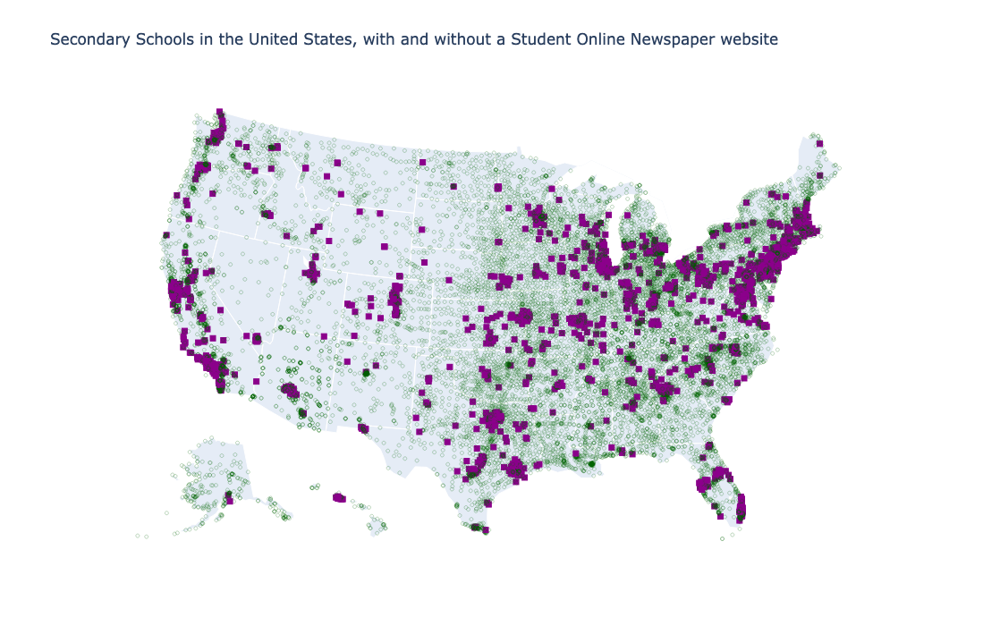

In [93]:
alldata = pd.read_csv('thirdmerge_alldata.csv')

fig2 = go.Figure()

# Setting up color, opacity, symbol, size maps for markers
color_map = {1 : 'darkmagenta', 0 : 'darkgreen'}
school_color = alldata['Present'].map(color_map)

line_color_map = {1 : 'darkmagenta', 0 : 'darkgreen'}
school_line_color = alldata['Present'].map(line_color_map)

opacity_map = {1 : 1, 0 : 0.25}
school_opacity = alldata['Present'].map(opacity_map)

symbol_map = {1 : 'square', 0 : 'circle-open'}
school_symbol = alldata['Present'].map(symbol_map)

size_map = {1 : 6, 0 : 4}
school_size = alldata['Present'].map(size_map)

# Setting up to display states on hover using AP Style state abbreviations
ap_state_abbreviations = {"AL": "Ala.", "AK": "Alaska", "AZ": "Ariz.", "AR": "Ark.", "CA": "Calif.", "CO": "Colo.", "CT": "Conn.", "DE": "Del.", "FL": "Fla.",\
    "GA": "Ga.", "HI": "Hawaii", "ID": "Idaho", "IL": "Ill.", "IN": "Ind.", "IA": "Iowa", "KS": "Kan.", "KY": "Ky.", "LA": "La.", "ME": "Maine",\
    "MD": "Md.", "MA": "Mass.", "MI": "Mich.", "MN": "Minn.", "MS": "Miss.", "MO": "Mo.", "MT": "Mont.", "NE": "Neb.", "NV": "Nev.", "NH": "N.H.",\
    "NJ": "N.J.", "NM": "N.M.", "NY": "N.Y.", "NC": "N.C.", "ND": "N.D.", "OH": "Ohio", "OK": "Okla.", "OR": "Ore.", "PA": "Pa.", "RI": "R.I.",\
    "SC": "S.C.", "SD": "S.D.", "TN": "Tenn.", "TX": "Texas", "UT": "Utah", "VT": "Vt.", "VA": "Va.", "WA": "Wash.", "WV": "W.Va.", "WI": "Wis.",\
    "WY": "Wyo."}
alldata['State_AP'] = alldata['State'].map(ap_state_abbreviations)

# Setting up hover information
def custom_hover_text(row):
    if row['Present'] == 1:
        return f"<br>{str.title(row['School'])}</br>{str.title(row['City'])}, {row['State_AP']}</br>{row['Media']}<br><a href='{row['URL']}'>{row['URL']}</a>"
    else:
        return f"<br>{str.title(row['School'])}</br>{str.title(row['City'])}, {row['State_AP']}"

# Updating the figure
fig2.add_trace(go.Scattergeo(
    lon = alldata['X'],
    lat = alldata['Y'],
    mode = 'markers',
    hoverinfo = 'text',
    hovertext=alldata.apply(custom_hover_text, axis=1),
    marker = dict(color = school_color, line_color = school_line_color, opacity = school_opacity, symbol = school_symbol, size = school_size),
    textfont_family = 'Arial'
))  

fig2.update_traces(
     selector = dict(type='scattergeo'))

fig2.update_layout(
    title = 'Secondary Schools in the United States, with and without a Student Online Newspaper website',
    geo_scope='usa',
    height = 700
    )

fig2.show()

#### **A Map of Rural Public High Schools**

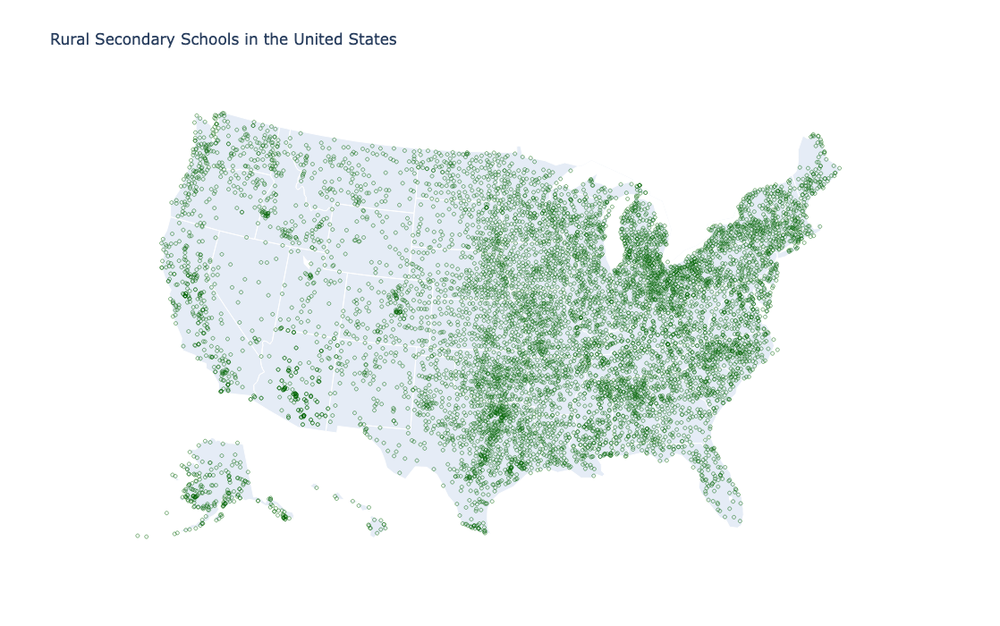

In [94]:
alldata = pd.read_csv('thirdmerge_alldata.csv')

alldata['Rural'] = 0

for i in alldata.index:
    if alldata['ULOCALE'][i] == '41-Rural: Fringe':
        alldata.at[i, 'Rural'] = 1
    elif alldata['ULOCALE'][i] == '42-Rural: Distant':
        alldata.at[i, 'Rural'] = 1
    elif alldata['ULOCALE'][i] == '43-Rural: Remote':
        alldata.at[i, 'Rural'] = 1

alldata = alldata[alldata['Rural'] == 1]

fig3 = go.Figure()

# Setting up to display states on hover using AP Style state abbreviations
ap_state_abbreviations = {"AL": "Ala.", "AK": "Alaska", "AZ": "Ariz.", "AR": "Ark.", "CA": "Calif.", "CO": "Colo.", "CT": "Conn.", "DE": "Del.", "FL": "Fla.",\
    "GA": "Ga.", "HI": "Hawaii", "ID": "Idaho", "IL": "Ill.", "IN": "Ind.", "IA": "Iowa", "KS": "Kan.", "KY": "Ky.", "LA": "La.", "ME": "Maine",\
    "MD": "Md.", "MA": "Mass.", "MI": "Mich.", "MN": "Minn.", "MS": "Miss.", "MO": "Mo.", "MT": "Mont.", "NE": "Neb.", "NV": "Nev.", "NH": "N.H.",\
    "NJ": "N.J.", "NM": "N.M.", "NY": "N.Y.", "NC": "N.C.", "ND": "N.D.", "OH": "Ohio", "OK": "Okla.", "OR": "Ore.", "PA": "Pa.", "RI": "R.I.",\
    "SC": "S.C.", "SD": "S.D.", "TN": "Tenn.", "TX": "Texas", "UT": "Utah", "VT": "Vt.", "VA": "Va.", "WA": "Wash.", "WV": "W.Va.", "WI": "Wis.",\
    "WY": "Wyo."}
alldata['State_AP'] = alldata['State'].map(ap_state_abbreviations)

# Setting up hover information
def custom_hover_text(row):
    if row['Present'] == 2:
        return f"<br>{str.title(row['School'])}</br>{str.title(row['City'])}, {row['State_AP']}</br>{row['Media']}<br><a href='{row['URL']}'>{row['URL']}</a>"
    else:
        return f"<br>{str.title(row['School'])}</br>{str.title(row['City'])}, {row['State_AP']}"

# Updating the figure
fig3.add_trace(go.Scattergeo(
    lon = alldata['X'],
    lat = alldata['Y'],
    mode = 'markers',
    hoverinfo = 'text',
    hovertext=alldata.apply(custom_hover_text, axis=1),
    marker = dict(color = 'darkgreen',\
                  line_color = 'darkgreen',\
                  opacity = 0.50,\
                  symbol = 'circle-open',\
                  size = 4),
    textfont_family = 'Arial'
))  

fig3.update_traces(
     selector = dict(type='scattergeo'))

fig3.update_layout(
    title = 'Rural Secondary Schools in the United States',
    geo_scope='usa',
    height = 700
    )

fig3.show()

#### **A Map of Rural Public High Schools with and without a Student Newspaper Online website**

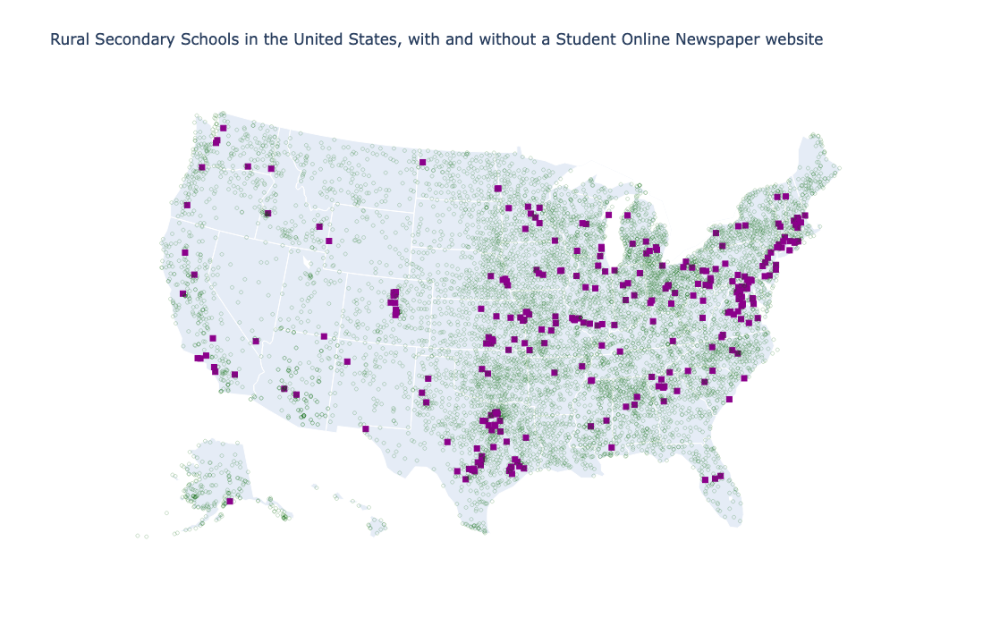

In [82]:
alldata = pd.read_csv('thirdmerge_alldata.csv')

alldata['Rural'] = 0

for i in alldata.index:
    if alldata['ULOCALE'][i] == '41-Rural: Fringe':
        alldata.at[i, 'Rural'] = 1
    elif alldata['ULOCALE'][i] == '42-Rural: Distant':
        alldata.at[i, 'Rural'] = 1
    elif alldata['ULOCALE'][i] == '43-Rural: Remote':
        alldata.at[i, 'Rural'] = 1

alldata = alldata[alldata['Rural'] == 1]

fig4 = go.Figure()

# Setting up color, opacity, symbol, size maps for markers
color_map = {1 : 'darkmagenta', 0 : 'darkgreen'}
school_color = alldata['Present'].map(color_map)

line_color_map = {1 : 'darkmagenta', 0 : 'darkgreen'}
school_line_color = alldata['Present'].map(line_color_map)

opacity_map = {1 : 1, 0 : 0.20}
school_opacity = alldata['Present'].map(opacity_map)

symbol_map = {1 : 'square', 0 : 'circle-open'}
school_symbol = alldata['Present'].map(symbol_map)

size_map = {1 : 6, 0 : 4}
school_size = alldata['Present'].map(size_map)

# Setting up to display states on hover using AP Style state abbreviations
ap_state_abbreviations = {"AL": "Ala.", "AK": "Alaska", "AZ": "Ariz.", "AR": "Ark.", "CA": "Calif.", "CO": "Colo.", "CT": "Conn.", "DE": "Del.", "FL": "Fla.",\
    "GA": "Ga.", "HI": "Hawaii", "ID": "Idaho", "IL": "Ill.", "IN": "Ind.", "IA": "Iowa", "KS": "Kan.", "KY": "Ky.", "LA": "La.", "ME": "Maine",\
    "MD": "Md.", "MA": "Mass.", "MI": "Mich.", "MN": "Minn.", "MS": "Miss.", "MO": "Mo.", "MT": "Mont.", "NE": "Neb.", "NV": "Nev.", "NH": "N.H.",\
    "NJ": "N.J.", "NM": "N.M.", "NY": "N.Y.", "NC": "N.C.", "ND": "N.D.", "OH": "Ohio", "OK": "Okla.", "OR": "Ore.", "PA": "Pa.", "RI": "R.I.",\
    "SC": "S.C.", "SD": "S.D.", "TN": "Tenn.", "TX": "Texas", "UT": "Utah", "VT": "Vt.", "VA": "Va.", "WA": "Wash.", "WV": "W.Va.", "WI": "Wis.",\
    "WY": "Wyo."}
alldata['State_AP'] = alldata['State'].map(ap_state_abbreviations)

# Setting up hover information
def custom_hover_text(row):
    if row['Present'] == 1:
        return f"<br>{str.title(row['School'])}</br>{str.title(row['City'])}, {row['State_AP']}</br>{row['Media']}<br><a href='{row['URL']}'>{row['URL']}</a>"
    else:
        return f"<br>{str.title(row['School'])}</br>{str.title(row['City'])}, {row['State_AP']}"

# Updating the figure
fig4.add_trace(go.Scattergeo(
    lon = alldata['X'],
    lat = alldata['Y'],
    mode = 'markers',
    hoverinfo = 'text',
    hovertext=alldata.apply(custom_hover_text, axis=1),
    marker = dict(color = school_color, line_color = school_line_color, opacity = school_opacity, symbol = school_symbol, size = school_size),
    textfont_family = 'Arial'
))  

fig4.update_traces(
     selector = dict(type='scattergeo'))

fig4.update_layout(
    title = 'Rural Secondary Schools in the United States, with and without a Student Online Newspaper website',
    geo_scope='usa',
    height = 700
    )

fig4.show()

By the numbers: 

- 22,398 public schools
- 1,787 public schools with SNO sites (8%)

- 8,531 rural schools
- 288 rural schools with SNO sites (3%)